## TFG MANEL

### Petita exploració de wordnet, com funciona, com es relaciona, com es l'estructura jerarquica.

1. Importació de llibreries

In [2]:
import nltk
from nltk.corpus import wordnet as wn
import networkx as nx
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import os
from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

#### Arbre del wordnet
- Es tracta d'un DAG, graf dirigit aciclic. No hi ha un camí que comenci i acabi en el mateix lloc

#### L'estructura del wordnet es basa en synsets

- Synset = Conjunt de sinònims representats per un d'ells, que té un significat únic. (Unitat Base de wordnet/imagenet)
- Un node recopila tots els sinònims d'aquella paraula dintre del mateix context, dog --> gos, dog --> perrito caliente, difs contexts
-  Cada node de l'arbre és un synset que es relaciona amb altres synsets en forma d'hiponims o hyperonims

#### L'estructura del synsets
- Cada sysnset es representa com : ParaulaClau.TipusParaula.Significat.
- Paraula Base : Paraula que reciopila tota la informació, tots el sinonims. Paraula Representativa
- Tipus de Paraula : Noun, Verb, Adjective, Adverb, etc
- Significat :Numero que identifica els diferents significats d'una paraula que s'escriu igual (paraules homonimes)
ex: dog i dog dog.n.01 = gos, dog.n.02 = perrito caliente

#### Informació dintre del synset
- Nom
- Definició
- Exemples
- Sinònims

#### Hyperonims i Hyponims
- Hyperonims: Són les paraules que tenen un significat més general 
- Hyponims: Són les paraules que tenen un significat més específic
ex: Animal --> gos, gat, etc. (Animal es un hyperonim de gos)
- Per a navegar per l'arbre anirem escalant per hyperonims fins a trobar el hyperonim general per a les paraules

#### Meronyms i Holonims
- Meronyms: Parts d'un concepte , ex : Cotxe --> Roda
- Holonims: Conceptes que estan compostos per meronyms, ex : Roda --> Cotxe

#### Objetivo: 
- Encontrar aquel concepto general que relacione los difernetes top scores de cada una de las neuronas de una capa

#### LCA: Least Common Ancestor
- Conjunto mas general para el conjunto de etiquetas

## COMENÇA L'EXPLORACIÓ

Print de la informació d'un sysnset

In [3]:
dog = wn.synset('dalmatian.n.02')
print("Nombre del Synset:", dog.name())
print("Definición:", dog.definition())
print("Ejemplos de uso:", dog.examples())
print("Sinónimos:", dog.lemma_names())

Nombre del Synset: dalmatian.n.02
Definición: a large breed having a smooth white coat with black or brown spots; originated in Dalmatia
Ejemplos de uso: []
Sinónimos: ['dalmatian', 'coach_dog', 'carriage_dog']


Hypernims i hyponims

In [4]:
hypernyms = dog.hypernyms()
print("Hypernyms :", [h.name() for h in hypernyms])
hyponyms = dog.hyponyms()
print("Hyponyms :", [h.name() for h in hyponyms]) 

Hypernyms : ['dog.n.01']
Hyponyms : ['liver-spotted_dalmatian.n.01']


LCA de dos exemples: gat i gos

In [5]:
# Synsets de "dog" y "cat"
dog = wn.synset('dog.n.01')
cat = wn.synset('cat.n.01')
lca = dog.lowest_common_hypernyms(cat)
print("Lowest Common Ancestor:", lca[0].name(), "-", lca[0].definition())


Lowest Common Ancestor: carnivore.n.01 - a terrestrial or aquatic flesh-eating mammal


Obtenir tot el camí, amb la descripció de cada pas

In [6]:
dog_paths = dog.hypernym_paths()
cat_paths = cat.hypernym_paths()

# Imprimir rutas
print("Ruta de 'dog.n.01':")
for synset in dog_paths[0]:
    print(f"  {synset.name()} - {synset.definition()}")

print("\nRuta de 'cat.n.01':")
for synset in cat_paths[0]:
    print(f"  {synset.name()} - {synset.definition()}")


Ruta de 'dog.n.01':
  entity.n.01 - that which is perceived or known or inferred to have its own distinct existence (living or nonliving)
  physical_entity.n.01 - an entity that has physical existence
  object.n.01 - a tangible and visible entity; an entity that can cast a shadow
  whole.n.02 - an assemblage of parts that is regarded as a single entity
  living_thing.n.01 - a living (or once living) entity
  organism.n.01 - a living thing that has (or can develop) the ability to act or function independently
  animal.n.01 - a living organism characterized by voluntary movement
  chordate.n.01 - any animal of the phylum Chordata having a notochord or spinal column
  vertebrate.n.01 - animals having a bony or cartilaginous skeleton with a segmented spinal column and a large brain enclosed in a skull or cranium
  mammal.n.01 - any warm-blooded vertebrate having the skin more or less covered with hair; young are born alive except for the small subclass of monotremes and nourished with milk

In [7]:
# Llistar tots els Synsets de "dog"
dog_synsets = wn.synsets('dog')
for synset in dog_synsets:
    print(f"{synset.name()} - {synset.definition()}")


dog.n.01 - a member of the genus Canis (probably descended from the common wolf) that has been domesticated by man since prehistoric times; occurs in many breeds
frump.n.01 - a dull unattractive unpleasant girl or woman
dog.n.03 - informal term for a man
cad.n.01 - someone who is morally reprehensible
frank.n.02 - a smooth-textured sausage of minced beef or pork usually smoked; often served on a bread roll
pawl.n.01 - a hinged catch that fits into a notch of a ratchet to move a wheel forward or prevent it from moving backward
andiron.n.01 - metal supports for logs in a fireplace
chase.v.01 - go after with the intent to catch


Graf per a visualitzar el cami

OJO: Hi ha diferents camins possibles per a un mateix synset, més d'un hypernim per paraula

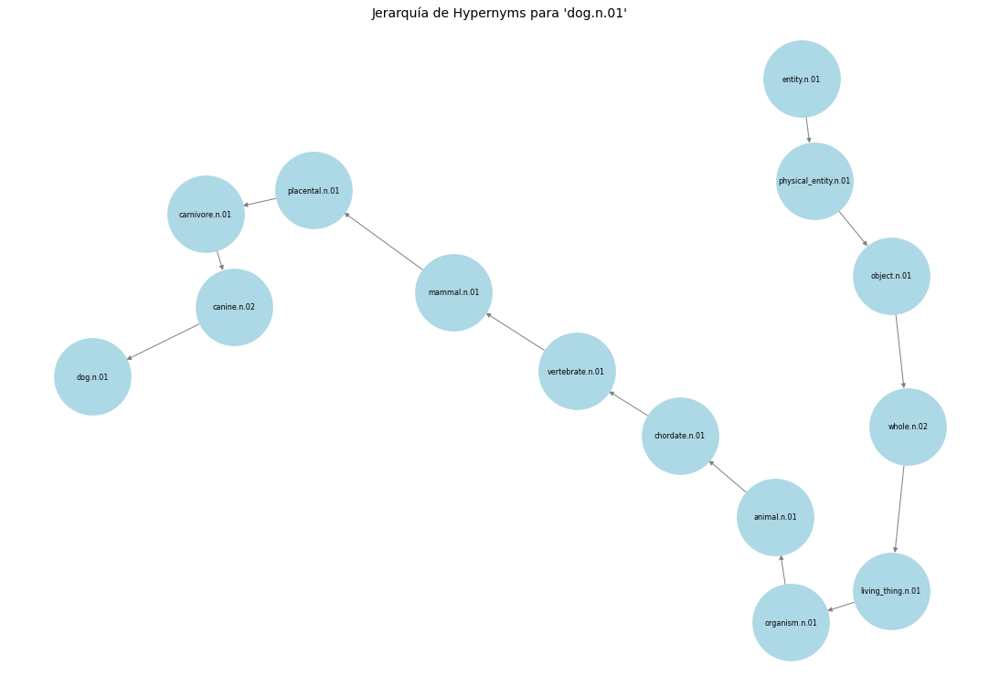

In [8]:

G = nx.DiGraph()
for synset in dog.hypernym_paths()[0]:
    G.add_node(synset.name(), label=synset.name())
    if synset.hypernyms():
        G.add_edge(synset.hypernyms()[0].name(), synset.name())
plt.figure(figsize=(15, 10))  # Aumentar el tamaño de la figura
pos = nx.spring_layout(G, seed=42)  # Distribución más clara
nx.draw(
    G,
    pos,
    with_labels=False,
    node_size=7000,
    node_color="lightblue",
    edge_color="gray",
    font_size=10,
)
labels = nx.get_node_attributes(G, 'label')
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, verticalalignment='center')

plt.title("Jerarquía de Hypernyms para 'dog.n.01'", fontsize=14)
plt.show()



Exemple més extens amb animals

In [9]:
image_labels = ['golden_retriever', 'beagle', 'labrador_retriever', 'wolf', 
                'fox', 'cat', 'lion', 'tiger', 'cheetah', 'dog']
synsets = [wn.synsets(label, pos=wn.NOUN)[0] for label in image_labels]
for synset in synsets:
    print(f"Etiqueta: {synset.name()} - {synset.definition()}")

Etiqueta: golden_retriever.n.01 - an English breed having a long silky golden coat
Etiqueta: beagle.n.01 - a small short-legged smooth-coated breed of hound
Etiqueta: labrador_retriever.n.01 - breed originally from Labrador having a short black or golden-brown coat
Etiqueta: wolf.n.01 - any of various predatory carnivorous canine mammals of North America and Eurasia that usually hunt in packs
Etiqueta: fox.n.01 - alert carnivorous mammal with pointed muzzle and ears and a bushy tail; most are predators that do not hunt in packs
Etiqueta: cat.n.01 - feline mammal usually having thick soft fur and no ability to roar: domestic cats; wildcats
Etiqueta: lion.n.01 - large gregarious predatory feline of Africa and India having a tawny coat with a shaggy mane in the male
Etiqueta: tiger.n.01 - a fierce or audacious person
Etiqueta: cheetah.n.01 - long-legged spotted cat of Africa and southwestern Asia having nonretractile claws; the swiftest mammal; can be trained to run down game
Etiqueta: do

In [10]:
common_ancestor = synsets[0] 
for synset in synsets[1:]:
    common_ancestor = common_ancestor.lowest_common_hypernyms(synset)[0]
print("Ancestro común más cercano:")
print(f"  {common_ancestor.name()} - {common_ancestor.definition()}")

Ancestro común más cercano:
  organism.n.01 - a living thing that has (or can develop) the ability to act or function independently


In [11]:
hypernym_path = common_ancestor.hypernym_paths()[0]
print("Ruta fins arrel")
for hypernym in hypernym_path:
    print(f"  {hypernym.name()} - {hypernym.definition()}")

Ruta fins arrel
  entity.n.01 - that which is perceived or known or inferred to have its own distinct existence (living or nonliving)
  physical_entity.n.01 - an entity that has physical existence
  object.n.01 - a tangible and visible entity; an entity that can cast a shadow
  whole.n.02 - an assemblage of parts that is regarded as a single entity
  living_thing.n.01 - a living (or once living) entity
  organism.n.01 - a living thing that has (or can develop) the ability to act or function independently


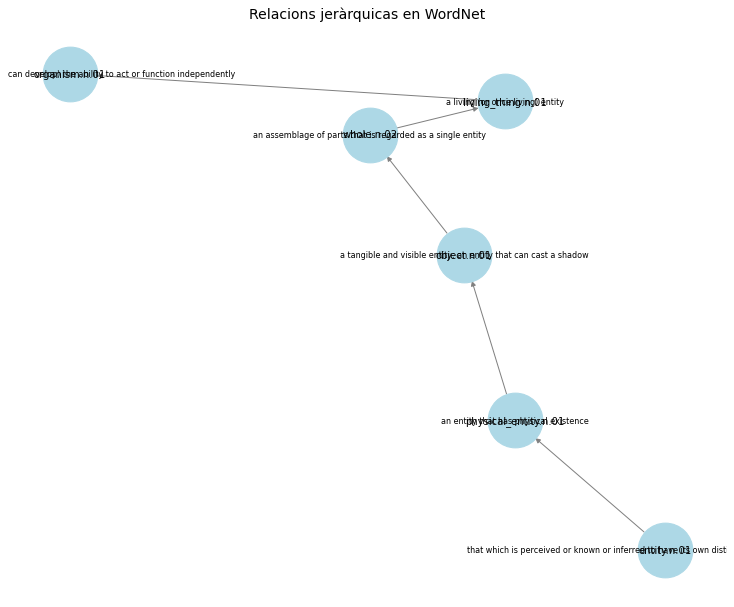

In [12]:
G = nx.DiGraph()
for synset in hypernym_path:
    G.add_node(synset.name(), label=synset.definition())
    if synset.hypernyms():
        G.add_edge(synset.hypernyms()[0].name(), synset.name())
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=3000, node_color="lightblue", edge_color="gray", font_size=10)
labels = nx.get_node_attributes(G, 'label')
nx.draw_networkx_labels(G, pos, labels=labels, font_size=8, verticalalignment='center')

plt.title("Relacions jeràrquicas en WordNet", fontsize=14)
plt.show()


## Similaritats entre les definicions

In [13]:
# Definiciones de los Synsets
definitions = [synset.definition() for synset in synsets]

# Calcular vectores TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(definitions)

# Calcular similitud coseno entre las definiciones
similarity_matrix = cosine_similarity(tfidf_matrix)
print("Matriz de similitud:")
print(similarity_matrix)


Matriz de similitud:
[[1.         0.09032877 0.31070855 0.         0.         0.04116789
  0.1054667  0.         0.10414647 0.        ]
 [0.09032877 1.         0.17519629 0.07654285 0.         0.
  0.03958876 0.         0.10041574 0.02964475]
 [0.31070855 0.17519629 1.         0.         0.         0.03461853
  0.08868811 0.12962067 0.02872    0.05298597]
 [0.         0.07654285 0.         1.         0.25748113 0.08343271
  0.17162625 0.         0.06809628 0.09825884]
 [0.         0.         0.         0.25748113 1.         0.08697805
  0.1285766  0.         0.07215818 0.05112363]
 [0.04116789 0.         0.03461853 0.08343271 0.08697805 1.
  0.11460694 0.         0.13225882 0.        ]
 [0.1054667  0.03958876 0.08868811 0.17162625 0.1285766  0.11460694
  1.         0.         0.15539098 0.11366035]
 [0.         0.         0.12962067 0.         0.         0.
  0.         1.         0.         0.        ]
 [0.10414647 0.10041574 0.02872    0.06809628 0.07215818 0.13225882
  0.15539098 0.

# INICI DE TFG

## TASCA 1

- Ens ve la informació per carpetes:
    - 1 Llistes TFG
        - 2 Capes
            - 3 Neurones de cada capa
                - 4 Top 100 imatges de cada una de les neurones

Llegir la informació de les llistes que ens han donat i crar un mapping per a poder tindre en forma de classe de imagenet per a poder fer una posterior cerca

Definiré diferntes funcions:
- 1 Llegir els documents
- 2 Crear el mapping
- 3 Crear nou document amb els synsets de l'imagenet

## Pas 1: Càrrega de les dades de les capes

En aquest pas, carregarem els arxius `.npy` que contenen les dades de les diferents capes de la xarxa neuronal. 
Cada capa conté una matriu on cada fila representa una neurona i les seves imatges associades.

### **Objectiu**
- Llegir els arxius `.npy` de les diferents capes (`relu`, `layer1`, `layer2`, `layer3`).
- Organitzar les dades en un diccionari per accedir-hi fàcilment.
- Verificar la mida de cada capa després de carregar-les.


1.Leer los archivos guardado en formado array

In [14]:
def load_data(base_path, layers):
    data = {}
    for layer in layers:
        file_path = os.path.join(base_path, f"{layer}.npy")
        if os.path.exists(file_path):
            data[layer] = np.load(file_path, allow_pickle=True)
            print(f"Load {layer} - Shape: {data[layer].shape}")
        else:
            print(f"Not found {file_path}")
    return data
base_path = "../Data/" 
layers = ["relu", "layer1", "layer2", "layer3","layer4_2"]

data = load_data(base_path, layers)

Load relu - Shape: (64, 100)
Load layer1 - Shape: (256, 100)
Load layer2 - Shape: (512, 100)
Load layer3 - Shape: (1024, 100)
Load layer4_2 - Shape: (2048, 100)


## Pas 2

1. Funció per a converir un wnid a un synset

In [15]:
def wnid_a_synset(wnid):
    """
    Converteix un WNID d'ImageNet a un synset de WordNet utilitzant NLTK.

    Paràmetres:
    - wnid: str, identificador WNID d'ImageNet (exemple: 'n02119789').

    Retorna:
    - Synset de WordNet si existeix, altrament None.
    """
    try:
        synset = wn.synset_from_pos_and_offset('n', int(wnid[1:]))  # Convertim el codi WNID en un synset
        return synset
    except:
        return None

# Prova amb exemple
wnid_exemple = "n02119789"  # Kit fox
synset = wnid_a_synset(wnid_exemple)

if synset:
    print(f"WNID: {wnid_exemple}")
    print(f"Synset: {synset}")
    print(f"Definició: {synset.definition()}")
    print(f"Sinònims: {synset.lemma_names()}")
else:
    print(f"No s'ha trobat un synset per {wnid_exemple}")

WNID: n02119789
Synset: Synset('kit_fox.n.01')
Definició: small grey fox of southwestern United States; may be a subspecies of Vulpes velox
Sinònims: ['kit_fox', 'Vulpes_macrotis']


2. Funcio per a mapeig manual tot i que tenim llibreries nltk

In [16]:
def carregar_mapeig_wnid(ruta_fitxer):
    """
    Carrega el fitxer `Image_net_Classes.txt` i construeix un diccionari {WNID: nom_classe}.

    Paràmetres:
    - ruta_fitxer: str, ruta de l'arxiu.

    Retorna:
    - Diccionari {WNID: nom_classe}.
    """
    mapeig = {}
    with open(ruta_fitxer, "r") as f:
        for linia in f:
            parts = linia.strip().split(": ")  # Format: "nxxxxx: nom_classe"
            if len(parts) == 2:
                wnid, nom_classe = parts
                mapeig[wnid] = nom_classe
    return mapeig

ruta_mapeig = "../Data/Image_net_Classes.txt"  # Ajusta la ruta si cal
mapeig_wnids_manual = carregar_mapeig_wnid(ruta_mapeig)
list(mapeig_wnids_manual.items())[:5]

[('n02119789', 'kit fox, Vulpes macrotis'),
 ('n02100735', 'English setter'),
 ('n02096294', 'Australian terrier'),
 ('n02066245',
  'grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus'),
 ('n02509815',
  'lesser panda, red panda, panda, bear cat, cat bear, Ailurus fulgens')]

3. Funció de traspas / mapping

In [17]:
def obtenir_synset(wnid, mapeig_manual):
    """
    Intenta obtenir la informació d'un WNID utilitzant WordNet i, si no funciona, usa el mapeig manual.

    Paràmetres:
    - wnid: str, identificador WNID d'ImageNet.
    - mapeig_manual: dict, diccionari {WNID: nom_classe} carregat de `Image_net_Classes.txt`.

    Retorna:
    - Tuple (synset, definició, sinònims).
    """
    synset = wnid_a_synset(wnid)
    if synset:
        return synset, synset.definition(), synset.lemma_names()
    elif wnid in mapeig_manual:
        return None, f"Nom a ImageNet: {mapeig_manual[wnid]}", []
    else:
        return None, "Sense informació", []

# Provar amb un exemple
wnid_exemple = "n02119789"  # Kit fox
resultat = obtenir_synset(wnid_exemple, mapeig_wnids_manual)

print(f"WNID: {wnid_exemple}")
print(f"Synset: {resultat[0]}")
print(f"Descripció: {resultat[1]}")
print(f"Sinònims: {resultat[2]}")


WNID: n02119789
Synset: Synset('kit_fox.n.01')
Descripció: small grey fox of southwestern United States; may be a subspecies of Vulpes velox
Sinònims: ['kit_fox', 'Vulpes_macrotis']


4. Traspàs complet

In [18]:
import re
from collections import Counter

def processar_i_convertir_synsets(dades_capas, mapeig_manual, top_n=5):
    """
    Processa les capes de la xarxa neuronal per obtenir els synsets associats a cada neurona.
    - Converteix tots els WNIDs a objectes Synset (NO només els top_k).
    - Genera estadístiques sobre els WNIDs més activadors.

    Paràmetres:
    - dades_capas: dict, diccionari original amb capes i activacions per neurona.
    - mapeig_manual: dict, diccionari {WNID: nom_classe} carregat de `Image_net_Classes.txt`.
    - top_n: int, nombre de WNIDs més activadors a mostrar per cada neurona (només per imprimir).

    Retorna:
    - Un diccionari amb la mateixa estructura que `dades_capas`, però amb objectes Synset (tots, no només els top_k).
    - Estadístiques de conversió i activació.
    """
    dades_synsets = {}
    estadistiques = {}

    for capa, activacions in dades_capas.items():
        dades_synsets[capa] = []  # Inicialitzem la capa
        estadistiques[capa] = {}

        print(f"\n====== Processant capa: {capa} ({len(activacions)} neurones) ======")

        for neuron_idx, row in enumerate(activacions):
            wnids = [path.split('/')[0] for path in row]  # Extreure WNIDs
            wnids_counter = Counter(wnids)  # Comptar repeticions de cada WNID

            # Convertir TOTS els WNIDs a synsets
            synsets_info = [(wnid, obtenir_synset(wnid, mapeig_manual)[0]) for wnid in wnids]
            synsets_valids = [synset for wnid, synset in synsets_info if synset]  # Filtrar els None

            # Guardar TOTS els synsets per a aquesta neurona
            dades_synsets[capa].append(synsets_valids)

            # Obtenir només les top-k més freqüents per imprimir mètriques
            wnids_most_common = wnids_counter.most_common(top_n)
            top_synsets = [(wnid, obtenir_synset(wnid, mapeig_manual)[0], freq) for wnid, freq in wnids_most_common]
            top_synsets_valids = [(wnid, synset, freq) for wnid, synset, freq in top_synsets if synset]

            # Estadístiques
            total_wnids = sum(wnids_counter.values())
            wnids_unics = len(wnids_counter)
            wnids_valids = len(synsets_valids)
            ratio_conversion = (wnids_valids / len(wnids)) * 100 if wnids else 0
            mitjana_sinonims = sum(len(synset.lemma_names()) for synset in synsets_valids) / wnids_valids if wnids_valids else 0

            # Guardar estadístiques
            estadistiques[capa][f"neuron_{neuron_idx}"] = {
                "total_imatges": total_wnids,
                "total_WNIDs_diferents": wnids_unics,
                "WNIDs_convertits": wnids_valids,
                "ratio_conversion": ratio_conversion,
                "mitjana_sinonims": mitjana_sinonims,
                "top_WNIDs": {wnid: freq for wnid, _, freq in top_synsets_valids}
            }

            # Imprimir mètriques per neurona
            print(f"\nNeurona {neuron_idx}:")
            print(f"  - Total imatges processades: {total_wnids}")
            print(f"  - Total WNIDs diferents: {wnids_unics}")
            print(f"  - WNIDs convertits correctament: {wnids_valids}")
            print(f"  - Ràtio de conversió: {ratio_conversion:.2f}%")
            print(f"  - Mitjana de sinònims per synset: {mitjana_sinonims:.2f}")
            print(f"  - Principals WNIDs que activen la neurona:")
            for wnid, synset, freq in top_synsets_valids:
                print(f"    - {synset}: {synset.definition()} (Freqüència: {freq})")

    return dades_synsets, estadistiques

In [19]:
# Executar la conversió i processament
dades_synsets, stats = processar_i_convertir_synsets(data, mapeig_wnids_manual)

# Veure dades transformades (Synsets de les primeres 2 neurones de 'relu')
for i, synsets in enumerate(dades_synsets["relu"][:2]):
    print(f"\nNeurona {i}:")
    for synset in synsets[:5]:  # Mostrem només els 5 primers per no imprimir massa
        print(f"  - {synset} -> {synset.definition()} (sinònims: {synset.lemma_names()})")

# Veure estadístiques d'una capa
import json
print(json.dumps(stats["layer4_2"], indent=4, ensure_ascii=False))



====== Processant capa: relu (64 neurones) ======

Neurona 0:
  - Total imatges processades: 100
  - Total WNIDs diferents: 74
  - WNIDs convertits correctament: 100
  - Ràtio de conversió: 100.00%
  - Mitjana de sinònims per synset: 1.56
  - Principals WNIDs que activen la neurona:
    - Synset('zebra.n.01'): any of several fleet black-and-white striped African equines (Freqüència: 18)
    - Synset('buckle.n.01'): fastener that fastens together two ends of a belt or strap; often has loose prong (Freqüència: 3)
    - Synset('typewriter_keyboard.n.01'): a keyboard for manually entering characters to be printed (Freqüència: 2)
    - Synset('cardoon.n.02'): only parts eaten are roots and especially stalks (blanched and used as celery); related to artichokes (Freqüència: 2)
    - Synset('suspension_bridge.n.01'): a bridge that has a roadway supported by cables that are anchored at both ends (Freqüència: 2)

Neurona 1:
  - Total imatges processades: 100
  - Total WNIDs diferents: 75
  - WN

In [20]:
dades_synsets

{'relu': [[Synset('breastplate.n.01'),
   Synset('typewriter_keyboard.n.01'),
   Synset('analog_clock.n.01'),
   Synset('minibus.n.01'),
   Synset('cardoon.n.02'),
   Synset('space_shuttle.n.01'),
   Synset('ocarina.n.01'),
   Synset('whiptail.n.01'),
   Synset('limousine.n.01'),
   Synset('zebra.n.01'),
   Synset('bobsled.n.02'),
   Synset('miniskirt.n.01'),
   Synset('suspension_bridge.n.01'),
   Synset('goose.n.01'),
   Synset('long-horned_beetle.n.01'),
   Synset('boathouse.n.01'),
   Synset('zebra.n.01'),
   Synset('tape_player.n.01'),
   Synset('yawl.n.01'),
   Synset('buckle.n.01'),
   Synset('lawn_mower.n.01'),
   Synset('shovel.n.01'),
   Synset('window_shade.n.01'),
   Synset('zebra.n.01'),
   Synset('beach_wagon.n.01'),
   Synset('consomme.n.01'),
   Synset('night_snake.n.01'),
   Synset('gondola.n.02'),
   Synset('loupe.n.01'),
   Synset('cassette_player.n.01'),
   Synset('spider_web.n.01'),
   Synset('hoopskirt.n.01'),
   Synset('zebra.n.01'),
   Synset('buckle.n.01'),
   

Funció Main per a poder processar totes les capes alhora i crear un json amb els synsets que hem mapejat

## Funció d'anàlisis

## 1. Funció semblant a l'anterior pero per una capa només

In [21]:
def veure_classes_més_repetides(capa, dades_capas, mapeig_manual, top_n=5):
    """
    Mostra les classes d'ImageNet més repetides per cada neurona en una capa donada.

    Paràmetres:
    - capa: str, nom de la capa ('relu', 'layer1', etc.).
    - dades_capas: dict, diccionari amb les dades processades (synsets per neurona).
    - mapeig_manual: dict, mapeig {WNID: nom_classe} carregat de `Image_net_Classes.txt`.
    - top_n: int, nombre de classes més freqüents a mostrar per cada neurona.

    Retorna:
    - Diccionari {neurona: [(classe, definició, freqüència)]} amb les classes més activadores.
    """
    if capa not in dades_capas:
        print(f"La capa '{capa}' no existeix.")
        return {}

    print(f"\n====== Anàlisi de les classes més repetides a la capa: {capa} ======")

    resultats = {}
    
    for neuron_idx, synsets in enumerate(dades_capas[capa]):
        # Contar la frecuencia de cada clas
        synset_counter = Counter(synsets)
        synset_most_common = synset_counter.most_common(top_n)

        # Guardar informació de les classes més repetides
        resultats[f"neuron_{neuron_idx}"] = [
            (synset.name(), synset.definition(), freq)
            for synset, freq in synset_most_common
        ]

        # Imprimir resultats per a cada neurona
        print(f"\nNeurona {neuron_idx}:")
        for synset, freq in synset_most_common:
            print(f"  - {synset.name()} ({freq} vegades) -> {synset.definition()}")

    return resultats

In [22]:
resultats_classes = veure_classes_més_repetides("layer4_2", dades_synsets, mapeig_wnids_manual)
# Veure les classes més repetides d'una neurona concreta
import json
print(json.dumps(resultats_classes["neuron_0"], indent=4, ensure_ascii=False))


====== Anàlisi de les classes més repetides a la capa: layer4_2 ======

Neurona 0:
  - paddle.n.04 (68 vegades) -> a short light oar used without an oarlock to propel a canoe or small boat
  - ground_beetle.n.01 (8 vegades) -> predacious shining black or metallic terrestrial beetle that destroys many injurious insects
  - canoe.n.01 (6 vegades) -> small and light boat; pointed at both ends; propelled with a paddle
  - wooden_spoon.n.02 (5 vegades) -> a spoon made of wood
  - spatula.n.01 (3 vegades) -> a turner with a narrow flexible blade

Neurona 1:
  - eft.n.01 (12 vegades) -> a newt in its terrestrial stage of development
  - coral_fungus.n.01 (8 vegades) -> any of numerous fungi of the family Clavariaceae often brightly colored that grow in often intricately branched clusters like coral
  - common_newt.n.01 (8 vegades) -> small semiaquatic salamander
  - mushroom.n.05 (6 vegades) -> fleshy body of any of numerous edible fungi
  - slug.n.07 (4 vegades) -> any of various terrestria

## ESTRATEGIES DE CERCA

## Cerca del concepte predominant

##### 1. LCA (lowest conmmon ancestor)


====== Processant capa: relu ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentalit


====== Processant capa: layer1 ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):



====== Processant capa: layer2 ======

====== Processant capa: layer3 ======

====== Processant capa: layer4_2 ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):



====== Llista de LCAs únics per cada capa ======

Capa relu:
entity, object, physical_entity, whole

Capa layer1:
entity, object, physical_entity, whole

Capa layer2:
entity, object, physical_entity, whole

Capa layer3:
animal, artifact, carnivore, dog, entity, instrumentality, object, physical_entity, vertebrate, whole

Capa layer4_2:
New_World_monkey, Old_World_monkey, acarine, adhesive_bandage, agamid, airfoil, anguid_lizard, animal, antelope, apodiform_bird, aquatic_bird, arachnid, arthropod, artifact, ball, bear, beetle, big_cat, bird, bird_of_prey, bovid, bridge, bus, butterfly, butterfly_fish, canine, cap, carnivore, cephalopod, cobra, coelenterate, conveyance, coraciiform_bird, craft, cuckoo, cyprinid, decapod_crustacean, device, diapsid, dog, edentate, entity, even-toed_ungulate, feline, finch, fox, frozen_dessert, fruit, fungus, game_bird, ganoid, grouse, hand_glass, hand_tool, hat, homopterous_insect, hunting_dog, implement, insect, instrumentality, invertebrate, kitchen_ap

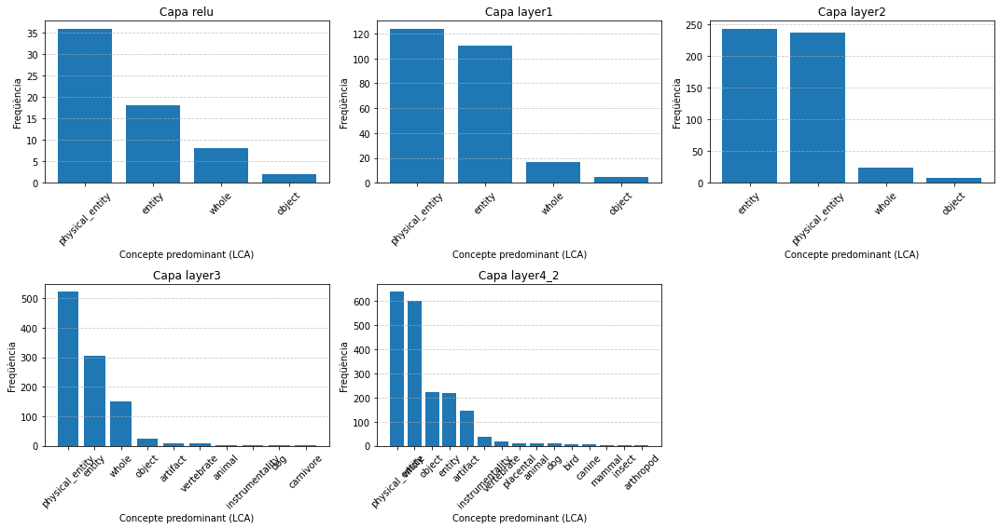

In [23]:
import matplotlib.pyplot as plt
from collections import Counter
import math

def trobar_LCA_synsets(synsets):
    """
    Troba l'ancestre comú més baix (LCA) d'una llista de synsets en WordNet.

    Paràmetres:
    - synsets: Llista de synsets de WordNet.

    Retorna:
    - Synset que representa l'hiperònim més específic compartit per tots.
    """
    if not synsets:
        return None

    # Obtenir la llista de tots els camins fins a la arrel per cada synset
    camins = [set(s.closure(lambda s: s.hypernyms())) for s in synsets]

    # Trobar la intersecció més profunda entre tots els camins
    interseccio = set.intersection(*camins)

    if interseccio:
        # Seleccionar el synset més profund (més específic)
        return max(interseccio, key=lambda s: len(list(s.closure(lambda s: s.hypernyms()))))

    return None  # Si no hi ha un ancestre comú

def processar_LCA_per_capa(dades_synsets):
    """
    Processa cada capa i cada neurona trobant el LCA dels synsets activats.

    Paràmetres:
    - dades_synsets: Diccionari {capa: llista de neurones}, on cada neurona és una llista de synsets.

    Retorna:
    - Diccionari amb el concepte predominant (LCA) per cada neurona.
    """
    resultats_LCA = {}
    lc_as_per_capa = {}  # Diccionari per guardar LCAs únics per cada capa
    dades_plots = []  # Llista per guardar dades dels barplots

    for capa, neurones in dades_synsets.items():
        print(f"\n====== Processant capa: {capa} ======")
        resultats_LCA[capa] = {}
        conceptes_capa = []  # Per acumular conceptes d'aquesta capa
        lc_as_unics = set()  # Per guardar només conceptes únics

        for neuron_idx, synsets in enumerate(neurones):
            lca = trobar_LCA_synsets(synsets)

            if lca:
                concepte = lca.lemmas()[0].name()
            else:
                concepte = "Sense informació"

            resultats_LCA[capa][f"neuron_{neuron_idx}"] = concepte
            conceptes_capa.append(concepte)
            lc_as_unics.add(concepte)

            # print(f"\ Neurona {neuron_idx}")
            # print(f" - Concepte predominant (LCA): {concepte}")

        # Guardar els LCAs únics per aquesta capa
        lc_as_per_capa[capa] = sorted(lc_as_unics)  # Ordenat alfabèticament

        # Comptar la freqüència i guardar per a visualització posterior
        comptador = Counter(conceptes_capa)
        conceptes_ordenats = comptador.most_common(15)  # Agafa només els 15 primers si n'hi ha més
        dades_plots.append((capa, conceptes_ordenats))  # Guardem per visualitzar al final

    # Imprimir els LCAs únics per cada capa
    print("\n====== Llista de LCAs únics per cada capa ======")
    for capa, lc_as in lc_as_per_capa.items():
        print(f"\nCapa {capa}:")
        print(", ".join(lc_as))

    # Generar tots els barplots junts
    if dades_plots:
        num_plots = len(dades_plots)
        cols = min(3, num_plots)  # Màxim 3 columnes per fila
        rows = math.ceil(num_plots / cols)  # Files necessàries

        fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
        axes = axes.flatten() if num_plots > 1 else [axes]  # Aplanar si és una sola capa

        for i, (capa, conceptes) in enumerate(dades_plots):
            noms, valors = zip(*conceptes) if conceptes else ([], [])

            axes[i].bar(noms, valors)
            axes[i].set_xlabel("Concepte predominant (LCA)")
            axes[i].set_ylabel("Freqüència")
            axes[i].set_title(f"Capa {capa}")
            axes[i].tick_params(axis='x', rotation=45)
            axes[i].grid(axis="y", linestyle="--", alpha=0.7)

        # Eliminar eixos buits si hi ha menys plots del previst
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

    return resultats_LCA

# Exemple d'ús:
resultats_LCA = processar_LCA_per_capa(dades_synsets)



### LCA 2


====== Processant capa: relu ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 7
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('ware.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 9
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('vehicle.n.01') at depth 4
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentalit


====== Processant capa: layer1 ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('food.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('fish.n.01') at depth 6
  for synset in acyclic_breadth_first(self, rel, depth):



====== Processant capa: layer2 ======

====== Processant capa: layer3 ======

====== Processant capa: layer4_2 ======


c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('animal.n.01') at depth 5
  for synset in acyclic_breadth_first(self, rel, depth):
c:\Users\manel\anaconda3\lib\site-packages\nltk\corpus\reader\wordnet.py:599: UserWarning: Discarded redundant search for Synset('instrumentality.n.03') at depth 3
  for synset in acyclic_breadth_first(self, rel, depth):



====== Llista de LCAs únics per cada capa ======

Capa relu:
Sense informació, object, physical_entity, whole

Capa layer1:
Sense informació, object, physical_entity, whole

Capa layer2:
Sense informació, object, physical_entity, whole

Capa layer3:
Sense informació, animal, artifact, carnivore, dog, entity, instrumentality, object, physical_entity, vertebrate, whole

Capa layer4_2:
New_World_monkey, Old_World_monkey, Sense informació, acarine, adhesive_bandage, agamid, airfoil, anguid_lizard, animal, antelope, apodiform_bird, aquatic_bird, arachnid, arthropod, artifact, ball, bear, beetle, big_cat, bird, bird_of_prey, bovid, bridge, bus, butterfly, butterfly_fish, canine, cap, carnivore, cephalopod, cobra, coelenterate, conveyance, coraciiform_bird, craft, cuckoo, cyprinid, decapod_crustacean, device, diapsid, dog, edentate, entity, even-toed_ungulate, feline, finch, fox, frozen_dessert, fruit, fungus, game_bird, ganoid, grouse, hand_glass, hand_tool, hat, homopterous_insect, hunting

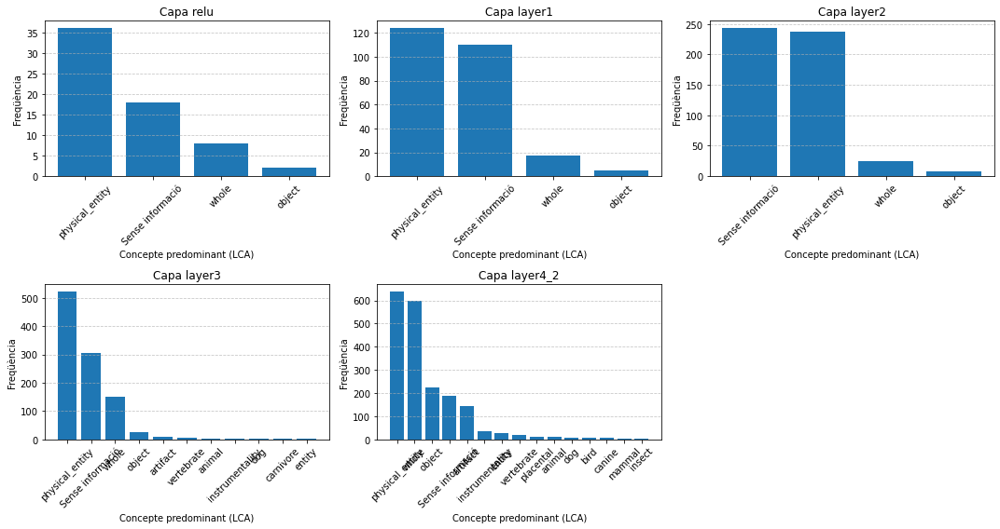

In [24]:
import matplotlib.pyplot as plt
from collections import Counter
import math

def validar_LCA_amb_similitud(synsets, lca):
    """
    Valida si el LCA trobat és realment representatiu comparant la similitud
    semàntica entre els synsets i el seu hiperònim LCA.

    Paràmetres:
    - synsets: Llista de synsets activats per una neurona.
    - lca: Synset que representa l'hiperònim més baix comú.

    Retorna:
    - True si el LCA és representatiu, False si és massa general.
    """
    if not lca or not synsets:
        return False

    # Calculem la mitjana de la similitud Wu-Palmer entre els synsets i el LCA
    similituds = [s.wup_similarity(lca) for s in synsets if s.wup_similarity(lca) is not None]

    if not similituds:
        return False  # Si no podem calcular cap similitud, descartem el LCA

    mitjana_similitud = sum(similituds) / len(similituds)

    # Si la similitud és baixa (< 0.2), significa que el LCA és massa general
    return mitjana_similitud >= 0.2

def processar_LCA_validat(dades_synsets):
    """
    Processa cada capa i cada neurona trobant el LCA validat amb similitud semàntica.

    Paràmetres:
    - dades_synsets: Diccionari {capa: llista de neurones}, on cada neurona és una llista de synsets.

    Retorna:
    - Diccionari amb el concepte predominant (LCA validat) per cada neurona.
    """
    resultats_LCA_validat = {}
    lc_as_per_capa = {}  # Diccionari per guardar LCAs únics per cada capa
    dades_plots = []  # Llista per guardar dades dels barplots

    for capa, neurones in dades_synsets.items():
        print(f"\n====== Processant capa: {capa} ======")
        resultats_LCA_validat[capa] = {}
        conceptes_capa = []  # Per acumular conceptes d'aquesta capa
        lc_as_unics = set()  # Per guardar només conceptes únics

        for neuron_idx, synsets in enumerate(neurones):
            lca = trobar_LCA_synsets(synsets)

            if lca and validar_LCA_amb_similitud(synsets, lca):
                concepte = lca.lemmas()[0].name()
            else:
                concepte = "Sense informació"  # Si el LCA és massa general, no el considerem

            resultats_LCA_validat[capa][f"neuron_{neuron_idx}"] = concepte
            conceptes_capa.append(concepte)
            lc_as_unics.add(concepte)

            # print(f"\n🔹 Neurona {neuron_idx}")
            # print(f"  - Concepte predominant (LCA validat): {concepte}")

        # Guardar els LCAs únics per aquesta capa
        lc_as_per_capa[capa] = sorted(lc_as_unics)  # Ordenat alfabèticament

        # Comptar la freqüència i guardar per a visualització posterior
        comptador = Counter(conceptes_capa)
        conceptes_ordenats = comptador.most_common(15)  # Agafa només els 15 primers si n'hi ha més
        dades_plots.append((capa, conceptes_ordenats))  # Guardem per visualitzar al final

    # Imprimir els LCAs únics per cada capa
    print("\n====== Llista de LCAs únics per cada capa ======")
    for capa, lc_as in lc_as_per_capa.items():
        print(f"\nCapa {capa}:")
        print(", ".join(lc_as))

    # Generar tots els barplots junts al final
    if dades_plots:
        num_plots = len(dades_plots)
        cols = min(3, num_plots)  # Màxim 3 columnes per fila
        rows = math.ceil(num_plots / cols)  # Files necessàries

        fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
        axes = axes.flatten() if num_plots > 1 else [axes]  # Aplanar si és una sola capa

        for i, (capa, conceptes) in enumerate(dades_plots):
            noms, valors = zip(*conceptes) if conceptes else ([], [])

            axes[i].bar(noms, valors)
            axes[i].set_xlabel("Concepte predominant (LCA)")
            axes[i].set_ylabel("Freqüència")
            axes[i].set_title(f"Capa {capa}")
            axes[i].tick_params(axis='x', rotation=45)
            axes[i].grid(axis="y", linestyle="--", alpha=0.7)

        # Eliminar eixos buits si hi ha menys plots del previst
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

    return resultats_LCA_validat

# Exemple d'ús:
resultats_LCA_validat = processar_LCA_validat(dades_synsets)



### Clustering Semantico

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter
import math
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

def clustering_semantic_synsets(synsets, n_clusters=3):
    """
    Agrupa synsets en clusters semánticos utilizando las definiciones de WordNet y K-Means.

    Parámetros:
    - synsets: Lista de synsets de una neurona.
    - n_clusters: Número de clusters a crear.

    Retorna:
    - clusters: Lista de listas de synsets agrupados semánticamente.
    """
    if not synsets:
        return [[] for _ in range(n_clusters)]  # Evitar errores si la lista está vacía

    # Obtener las definiciones de cada synset
    definiciones = [s.definition() for s in synsets]

    # Convertir las definiciones en vectores TF-IDF
    vectorizer = TfidfVectorizer()
    X = vectorizer.fit_transform(definiciones)

    # Aplicar K-Means para agrupar los synsets
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X)

    # Agrupar los synsets por cluster
    clusters = [[] for _ in range(n_clusters)]
    for idx, label in enumerate(labels):
        clusters[label].append(synsets[idx])

    return clusters

def processar_clusters_LCA(dades_synsets, n_clusters=2):
    """
    Procesa los synsets de cada neurona aplicando clustering semántico y encuentra el LCA de cada cluster.

    Parámetros:
    - dades_synsets: Diccionario con los synsets de cada capa y neurona.
    - n_clusters: Número de clusters para el clustering semántico.

    Retorna:
    - Diccionario con los conceptos predominantes (LCAs) de cada cluster.
    """
    resultats = {}
    lc_as_per_capa = {}  # Diccionario para almacenar LCAs únicos por capa
    dades_plots = []  # Lista para almacenar datos de los gráficos de barras

    for capa, neurones in dades_synsets.items():
        print(f"\n====== Processant capa: {capa} ======")
        resultats[capa] = {}
        conceptes_capa = []  # Para acumular conceptos de esta capa
        lc_as_unics = set()  # Para almacenar solo conceptos únicos

        for neuron_idx, synsets in enumerate(neurones):
            clusters = clustering_semantic_synsets(synsets, n_clusters=n_clusters)
            lca_clusters = []

            # Encontrar el LCA de cada cluster
            for cluster in clusters:
                lca = trobar_LCA_synsets(cluster)
                if lca:
                    concepte = lca.lemmas()[0].name()
                    lca_clusters.append(concepte)
                    conceptes_capa.append(concepte)
                    lc_as_unics.add(concepte)

            resultats[capa][f"neuron_{neuron_idx}"] = lca_clusters

            # print(f"\n🔹 Neurona {neuron_idx}")
            # print(f"  - Conceptes predominants per clusters: {lca_clusters}")

        # Guardar los LCAs únicos por esta capa
        lc_as_per_capa[capa] = sorted(lc_as_unics)  # Ordenado alfabéticamente

        # Contar la frecuencia y guardar para visualización posterior
        comptador = Counter(conceptes_capa)
        conceptes_ordenats = comptador.most_common(15)  # Tomar solo los 15 primeros si hay más
        dades_plots.append((capa, conceptes_ordenats))  # Guardar para visualizar al final

    # Imprimir los LCAs únicos por cada capa
    print("\n====== Llista de LCAs únics per cada capa ======")
    for capa, lc_as in lc_as_per_capa.items():
        print(f"\nCapa {capa}:")
        print(", ".join(lc_as))

    # Generar todos los barplots juntos al final
    if dades_plots:
        num_plots = len(dades_plots)
        cols = min(3, num_plots)  # Máximo 3 columnas por fila
        rows = math.ceil(num_plots / cols)  # Filas necesarias

        fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
        axes = axes.flatten() if num_plots > 1 else [axes]  # Aplanar si es una sola capa

        for i, (capa, conceptes) in enumerate(dades_plots):
            noms, valors = zip(*conceptes) if conceptes else ([], [])

            axes[i].bar(noms, valors)
            axes[i].set_xlabel("Concepte predominant (LCA)")
            axes[i].set_ylabel("Freqüència")
            axes[i].set_title(f"Capa {capa}")
            axes[i].tick_params(axis='x', rotation=45)
            axes[i].grid(axis="y", linestyle="--", alpha=0.7)

        # Eliminar ejes vacíos si hay menos plots de los previstos
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

    return resultats

# Ejecutamos el análisis con clustering semántico en la capa 'relu'
resultats_clusters_LCA = processar_clusters_LCA(dades_synsets, n_clusters=3)



## Clustering Semantico con Fastext

In [ ]:
import fasttext.util
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import math
from sklearn.cluster import KMeans

# Cargar el modelo preentrenado de FastText
fasttext.util.download_model('en', if_exists='ignore')  # Descarga si no está
ft_model = fasttext.load_model('cc.en.300.bin')  # Carga el modelo en inglés

def obtener_embedding(text):
    """
    Convierte una definición de WordNet en un vector usando FastText.
    """
    return ft_model.get_sentence_vector(text)

def clustering_semantic_synsets(synsets, n_clusters=3):
    """
    Agrupa synsets en clusters semánticos utilizando las definiciones de WordNet y FastText.

    Parámetros:
    - synsets: Lista de synsets de una neurona.
    - n_clusters: Número de clusters a crear.

    Retorna:
    - clusters: Lista de listas de synsets agrupados semánticamente.
    """
    if not synsets:
        return [[] for _ in range(n_clusters)]  # Evita errores si no hay synsets

    # Obtener las definiciones de cada synset y convertirlas en embeddings
    embeddings = np.array([obtener_embedding(s.definition()) for s in synsets])

    # Aplicar K-Means para agrupar los synsets
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(embeddings)

    # Agrupar los synsets por cluster
    clusters = [[] for _ in range(n_clusters)]
    for idx, label in enumerate(labels):
        clusters[label].append(synsets[idx])

    return clusters

def processar_clusters_LCA(dades_synsets, n_clusters=2):
    """
    Procesa los synsets de cada neurona aplicando clustering semántico con FastText
    y encuentra el LCA de cada cluster.

    Parámetros:
    - dades_synsets: Diccionario con los synsets de cada capa y neurona.
    - n_clusters: Número de clusters para el clustering semántico.

    Retorna:
    - Diccionario con los conceptos predominantes (LCAs) de cada cluster.
    """
    resultats = {}
    lc_as_per_capa = {}  # Diccionario para almacenar LCAs únicos por capa
    dades_plots = []  # Lista para almacenar datos de los gráficos de barras

    for capa, neurones in dades_synsets.items():
        print(f"\n====== Processant capa: {capa} ======")
        resultats[capa] = {}
        conceptes_capa = []  # Para acumular conceptos de esta capa
        lc_as_unics = set()  # Para almacenar solo conceptos únicos

        for neuron_idx, synsets in enumerate(neurones):
            clusters = clustering_semantic_synsets(synsets, n_clusters=n_clusters)
            lca_clusters = []

            # Encontrar el LCA de cada cluster
            for cluster in clusters:
                lca = trobar_LCA_synsets(cluster)
                if lca:
                    concepte = lca.lemmas()[0].name()
                    lca_clusters.append(concepte)
                    conceptes_capa.append(concepte)
                    lc_as_unics.add(concepte)

            resultats[capa][f"neuron_{neuron_idx}"] = lca_clusters

            # print(f"\n🔹 Neurona {neuron_idx}")
            # print(f"  - Conceptes predominants per clusters: {lca_clusters}")

        # Guardar los LCAs únicos por esta capa
        lc_as_per_capa[capa] = sorted(lc_as_unics)  # Ordenado alfabéticamente

        # Contar la frecuencia y guardar para visualización posterior
        comptador = Counter(conceptes_capa)
        conceptes_ordenats = comptador.most_common(15)  # Tomar solo los 15 primeros si hay más
        dades_plots.append((capa, conceptes_ordenats))  # Guardar para visualizar al final

    # Imprimir los LCAs únicos por cada capa
    print("\n====== Llista de LCAs únics per cada capa ======")
    for capa, lc_as in lc_as_per_capa.items():
        print(f"\nCapa {capa}:")
        print(", ".join(lc_as))

    # Generar todos los barplots juntos al final
    if dades_plots:
        num_plots = len(dades_plots)
        cols = min(3, num_plots)  # Máximo 3 columnas por fila
        rows = math.ceil(num_plots / cols)  # Filas necesarias

        fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
        axes = axes.flatten() if num_plots > 1 else [axes]  # Aplanar si es una sola capa

        for i, (capa, conceptes) in enumerate(dades_plots):
            noms, valors = zip(*conceptes) if conceptes else ([], [])

            axes[i].bar(noms, valors)
            axes[i].set_xlabel("Concepte predominant (LCA)")
            axes[i].set_ylabel("Freqüència")
            axes[i].set_title(f"Capa {capa}")
            axes[i].tick_params(axis='x', rotation=45)
            axes[i].grid(axis="y", linestyle="--", alpha=0.7)

        # Eliminar ejes vacíos si hay menos plots de los previstos
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

    return resultats

# Ejecutamos el análisis con clustering semántico con FastText
resultats_clusters_LCA = processar_clusters_LCA(dades_synsets, n_clusters=3)


### Noves idees